## Imports

In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
from keras.preprocessing.image import ImageDataGenerator
from keras import models, layers
from keras.preprocessing import image

from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten


import matplotlib.pyplot as plt
%matplotlib inline  
import sklearn.metrics as metrics
from PIL import Image
import glob
import os
import random
import cv2

## Linking to image directories

In [4]:
train_directory = r'images/train'
validate_directory = r'images/validate'
test_directory = r'images/test'

## Image Pre-processing
This project uses Keras Image Data Generators to perform augmentations in real time as they are being passed into the model.

In [47]:
image_height, image_width = 64,64
seed = 1

train_dg = ImageDataGenerator(
  rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
)

validate_dg = ImageDataGenerator(
    rescale=1./255
)

test_dg = ImageDataGenerator(
    rescale=1./255
)

train_gen = train_dg.flow_from_directory(
    train_directory,
    target_size=(image_height,image_width),
    class_mode='categorical',
    batch_size=8
)

validate_gen = validate_dg.flow_from_directory(
    validate_directory,
    target_size=(image_height,image_width),
    class_mode='categorical',
    batch_size=8
)

test_gen = test_dg.flow_from_directory(
    test_directory,
    target_size=(image_height, image_width),
    class_mode='categorical',
    batch_size=45,
    shuffle=False
)

class_names=['banana','brocolli','croissant','pasta','pork','rice'] #set class names

Found 2465 images belonging to 6 classes.
Found 518 images belonging to 6 classes.
Found 45 images belonging to 6 classes.


## Plotting some example training data after pre-processing

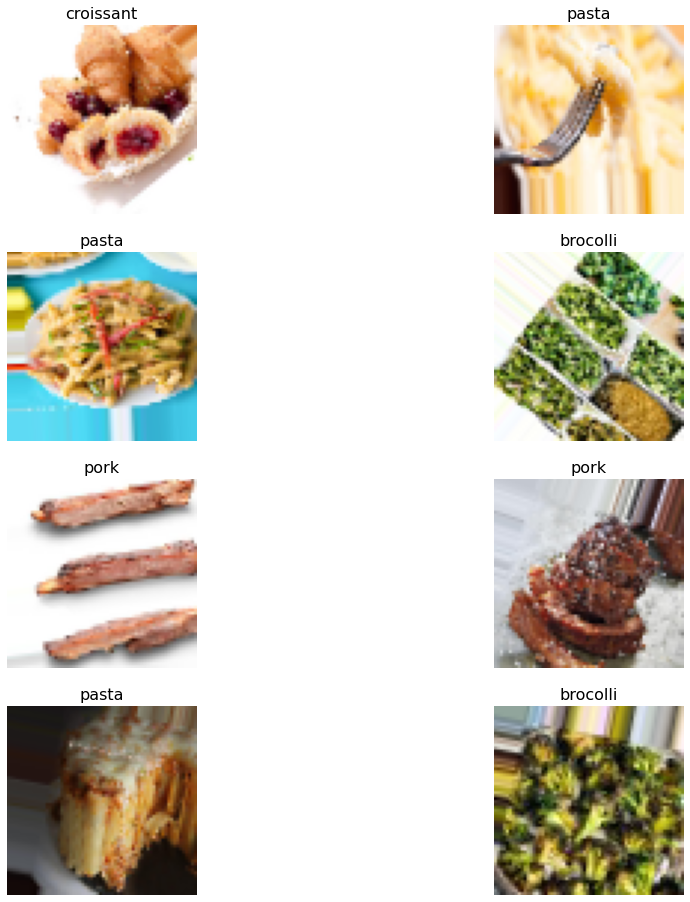

In [5]:
def plots(img, figsize=(16,16), rows=4, interp=False, titles=None):
    f=plt.figure(figsize=figsize)
    cols = len(img)//rows if len(img) % 2 == 0 else len(img)//rows + 1
    for i in range(len(img)):
        sp = f.add_subplot(rows,cols, i+1)
        sp.axis('Off')
        sp.set_title(class_names[titles[i].tolist().index(1)], fontsize=16)
        plt.imshow(img[i])
        
imgs, labels = next(train_gen)
plots(imgs,titles=labels)

## Initial Model

In [6]:
model = models.Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(3,3),activation='relu',input_shape=(image_width,image_height,3)))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(6, activation='softmax'))

from tensorflow.keras import optimizers
model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

history = model.fit(
    train_gen,
    steps_per_epoch = 123,
    epochs=10,
    validation_data=validate_gen,
    validation_steps=25
)

Epoch 1/10
123/123 [==============================] - 13s 109ms/step - loss: 1.7253 - accuracy: 0.3756 - val_loss: 1.1218 - val_accuracy: 0.6050
Epoch 2/10
123/123 [==============================] - 13s 104ms/step - loss: 1.1211 - accuracy: 0.5773 - val_loss: 0.9562 - val_accuracy: 0.5950
Epoch 3/10
123/123 [==============================] - 12s 96ms/step - loss: 1.0327 - accuracy: 0.5996 - val_loss: 1.1875 - val_accuracy: 0.5100
Epoch 4/10
123/123 [==============================] - 12s 99ms/step - loss: 0.9650 - accuracy: 0.6321 - val_loss: 0.8339 - val_accuracy: 0.6450
Epoch 5/10
123/123 [==============================] - 10s 85ms/step - loss: 0.9384 - accuracy: 0.6585 - val_loss: 0.8253 - val_accuracy: 0.6500
Epoch 6/10
123/123 [==============================] - 11s 92ms/step - loss: 0.9481 - accuracy: 0.6433 - val_loss: 0.8128 - val_accuracy: 0.6600
Epoch 7/10
123/123 [==============================] - 11s 92ms/step - loss: 0.8567 - accuracy: 0.6868 - val_loss: 0.7773 - val_accurac

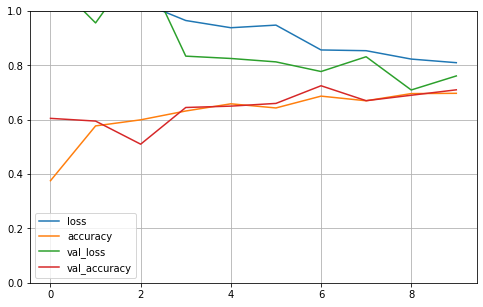

In [7]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.grid(True)
plt.gca().set_ylim(0,1)
plt.show()

## Optimising Kernel Size

Epoch 1/10
123/123 [==============================] - 11s 90ms/step - loss: 1.6171 - accuracy: 0.4217 - val_loss: 1.1980 - val_accuracy: 0.5000
Epoch 2/10
123/123 [==============================] - 10s 84ms/step - loss: 1.0662 - accuracy: 0.5965 - val_loss: 0.8863 - val_accuracy: 0.6650
Epoch 3/10
123/123 [==============================] - 11s 90ms/step - loss: 0.9136 - accuracy: 0.6602 - val_loss: 0.8320 - val_accuracy: 0.6700
Epoch 4/10
123/123 [==============================] - 11s 90ms/step - loss: 0.8669 - accuracy: 0.6807 - val_loss: 0.9743 - val_accuracy: 0.6250
Epoch 5/10
123/123 [==============================] - 10s 81ms/step - loss: 0.8455 - accuracy: 0.6714 - val_loss: 0.8209 - val_accuracy: 0.6900
Epoch 6/10
123/123 [==============================] - 11s 89ms/step - loss: 0.8473 - accuracy: 0.6809 - val_loss: 0.9497 - val_accuracy: 0.6050
Epoch 7/10
123/123 [==============================] - 12s 94ms/step - loss: 0.8386 - accuracy: 0.6819 - val_loss: 0.8506 - val_accuracy:

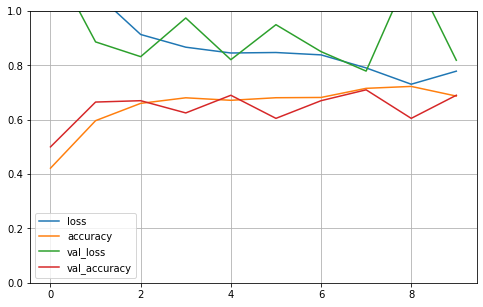

Epoch 1/10
123/123 [==============================] - 12s 99ms/step - loss: 1.6179 - accuracy: 0.3787 - val_loss: 1.1288 - val_accuracy: 0.5650
Epoch 2/10
123/123 [==============================] - 11s 91ms/step - loss: 1.1254 - accuracy: 0.5763 - val_loss: 0.9991 - val_accuracy: 0.5950
Epoch 3/10
123/123 [==============================] - 11s 90ms/step - loss: 1.0215 - accuracy: 0.6006 - val_loss: 0.8449 - val_accuracy: 0.6500
Epoch 4/10
123/123 [==============================] - 11s 90ms/step - loss: 0.9927 - accuracy: 0.6325 - val_loss: 0.8799 - val_accuracy: 0.6650
Epoch 5/10
123/123 [==============================] - 10s 85ms/step - loss: 0.8574 - accuracy: 0.6829 - val_loss: 0.7888 - val_accuracy: 0.6800
Epoch 6/10
123/123 [==============================] - 12s 95ms/step - loss: 0.9732 - accuracy: 0.6463 - val_loss: 0.7888 - val_accuracy: 0.6600
Epoch 7/10
123/123 [==============================] - 11s 92ms/step - loss: 0.9808 - accuracy: 0.6285 - val_loss: 1.0768 - val_accuracy:

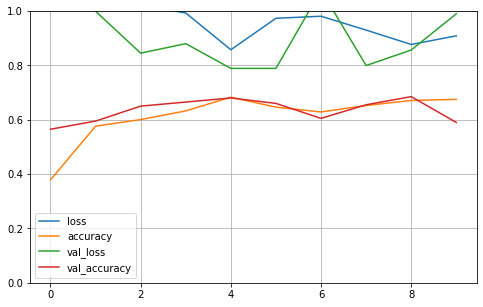

Epoch 1/10
123/123 [==============================] - 11s 91ms/step - loss: 1.6350 - accuracy: 0.2825 - val_loss: 1.3595 - val_accuracy: 0.4750
Epoch 2/10
123/123 [==============================] - 10s 84ms/step - loss: 1.4576 - accuracy: 0.4136 - val_loss: 1.3494 - val_accuracy: 0.4950
Epoch 3/10
123/123 [==============================] - 13s 104ms/step - loss: 1.3373 - accuracy: 0.4949 - val_loss: 1.2926 - val_accuracy: 0.4950
Epoch 4/10
123/123 [==============================] - 12s 95ms/step - loss: 1.2530 - accuracy: 0.5046 - val_loss: 1.1756 - val_accuracy: 0.5250
Epoch 5/10
123/123 [==============================] - 11s 87ms/step - loss: 1.1266 - accuracy: 0.5539 - val_loss: 1.0189 - val_accuracy: 0.6150
Epoch 6/10
123/123 [==============================] - 10s 82ms/step - loss: 1.0498 - accuracy: 0.6162 - val_loss: 1.1110 - val_accuracy: 0.5900
Epoch 7/10
123/123 [==============================] - 10s 84ms/step - loss: 1.0009 - accuracy: 0.6402 - val_loss: 0.9887 - val_accuracy

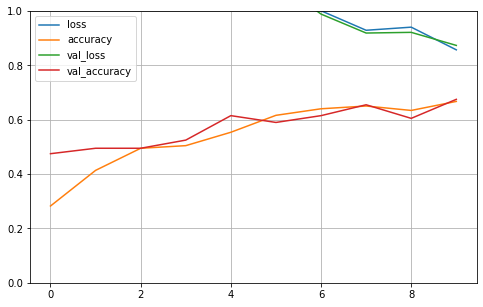

Epoch 1/10
123/123 [==============================] - 11s 90ms/step - loss: 1.7601 - accuracy: 0.2368 - val_loss: 1.6256 - val_accuracy: 0.2250
Epoch 2/10
123/123 [==============================] - 11s 91ms/step - loss: 1.6054 - accuracy: 0.3364 - val_loss: 1.5876 - val_accuracy: 0.3350
Epoch 3/10
123/123 [==============================] - 11s 87ms/step - loss: 1.5380 - accuracy: 0.3572 - val_loss: 1.5013 - val_accuracy: 0.3300
Epoch 4/10
123/123 [==============================] - 10s 85ms/step - loss: 1.4996 - accuracy: 0.3460 - val_loss: 1.3551 - val_accuracy: 0.4800
Epoch 5/10
123/123 [==============================] - 11s 92ms/step - loss: 1.3884 - accuracy: 0.4045 - val_loss: 1.3562 - val_accuracy: 0.4350
Epoch 6/10
123/123 [==============================] - 12s 97ms/step - loss: 1.3673 - accuracy: 0.4360 - val_loss: 1.2613 - val_accuracy: 0.4850
Epoch 7/10
123/123 [==============================] - 11s 93ms/step - loss: 1.3202 - accuracy: 0.4654 - val_loss: 1.4040 - val_accuracy:

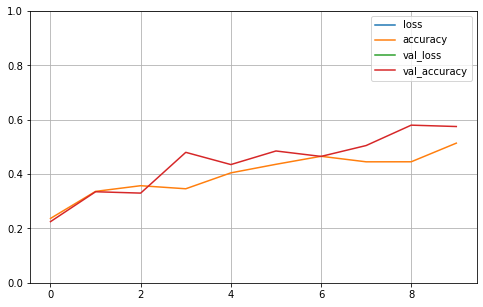

Epoch 1/10
123/123 [==============================] - 12s 95ms/step - loss: 1.7982 - accuracy: 0.2088 - val_loss: 1.7537 - val_accuracy: 0.2450
Epoch 2/10
123/123 [==============================] - 11s 90ms/step - loss: 1.7652 - accuracy: 0.2083 - val_loss: 1.7241 - val_accuracy: 0.2800
Epoch 3/10
123/123 [==============================] - 11s 90ms/step - loss: 1.7355 - accuracy: 0.2215 - val_loss: 1.7295 - val_accuracy: 0.2500
Epoch 4/10
123/123 [==============================] - 11s 88ms/step - loss: 1.7386 - accuracy: 0.2144 - val_loss: 1.6899 - val_accuracy: 0.2800
Epoch 5/10
123/123 [==============================] - 12s 99ms/step - loss: 1.7484 - accuracy: 0.2144 - val_loss: 1.6905 - val_accuracy: 0.2600
Epoch 6/10
123/123 [==============================] - 12s 99ms/step - loss: 1.7347 - accuracy: 0.2358 - val_loss: 1.7012 - val_accuracy: 0.2250
Epoch 7/10
123/123 [==============================] - 11s 91ms/step - loss: 1.7479 - accuracy: 0.1955 - val_loss: 1.6828 - val_accuracy:

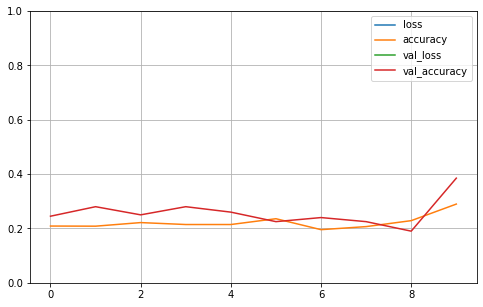

In [8]:
kernelSizes = [3,5,7,9,11]

for ks in kernelSizes:
    model = models.Sequential()
    model.add(layers.Conv2D(filters=32, kernel_size=(ks,ks),activation='relu',input_shape=(image_width,image_height,3)))
    model.add(layers.MaxPool2D(pool_size=(2, 2)))
    model.add(layers.Flatten())
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(6, activation='softmax'))
    
    from tensorflow.keras import optimizers
    model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)
    history = model.fit(
    train_gen,
    steps_per_epoch = 123,
    epochs=10,
    validation_data=validate_gen,
    validation_steps=25
)
    
    print("kernel Size:", ks)
    pd.DataFrame(history.history).plot(figsize=(8,5))
    plt.grid(True)
    plt.gca().set_ylim(0,1)
    plt.show()

## Optimising Batch Sizes

Epoch 1/10
307/307 [==============================] - 29s 93ms/step - loss: 1.2378 - accuracy: 0.5455 - val_loss: 0.9157 - val_accuracy: 0.6367
Epoch 2/10
307/307 [==============================] - 28s 91ms/step - loss: 0.9168 - accuracy: 0.6509 - val_loss: 0.8827 - val_accuracy: 0.6523
Epoch 3/10
307/307 [==============================] - 28s 92ms/step - loss: 0.8604 - accuracy: 0.6770 - val_loss: 0.9345 - val_accuracy: 0.6426
Epoch 4/10
307/307 [==============================] - 29s 93ms/step - loss: 0.8626 - accuracy: 0.6746 - val_loss: 0.7615 - val_accuracy: 0.6992
Epoch 5/10
307/307 [==============================] - 29s 94ms/step - loss: 0.7847 - accuracy: 0.7227 - val_loss: 0.9933 - val_accuracy: 0.6367
Epoch 6/10
307/307 [==============================] - 29s 93ms/step - loss: 0.7994 - accuracy: 0.6995 - val_loss: 0.7656 - val_accuracy: 0.7109
Epoch 7/10
307/307 [==============================] - 28s 93ms/step - loss: 0.7860 - accuracy: 0.7154 - val_loss: 0.9304 - val_accuracy:

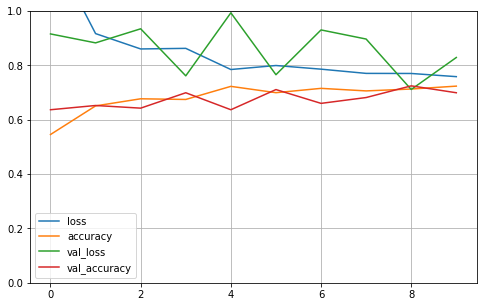

Epoch 1/10
153/153 [==============================] - 14s 93ms/step - loss: 1.2292 - accuracy: 0.5547 - val_loss: 1.2026 - val_accuracy: 0.5282
Epoch 2/10
153/153 [==============================] - 13s 86ms/step - loss: 0.9690 - accuracy: 0.6319 - val_loss: 0.9401 - val_accuracy: 0.6492
Epoch 3/10
153/153 [==============================] - 15s 99ms/step - loss: 0.9475 - accuracy: 0.6417 - val_loss: 0.7877 - val_accuracy: 0.7218
Epoch 4/10
153/153 [==============================] - 14s 92ms/step - loss: 0.8991 - accuracy: 0.6598 - val_loss: 0.7684 - val_accuracy: 0.6976
Epoch 5/10
153/153 [==============================] - 14s 93ms/step - loss: 0.7974 - accuracy: 0.7002 - val_loss: 0.7171 - val_accuracy: 0.7298
Epoch 6/10
153/153 [==============================] - 14s 94ms/step - loss: 0.8021 - accuracy: 0.6863 - val_loss: 0.8048 - val_accuracy: 0.7016
Epoch 7/10
153/153 [==============================] - 15s 99ms/step - loss: 0.8346 - accuracy: 0.6820 - val_loss: 0.7665 - val_accuracy:

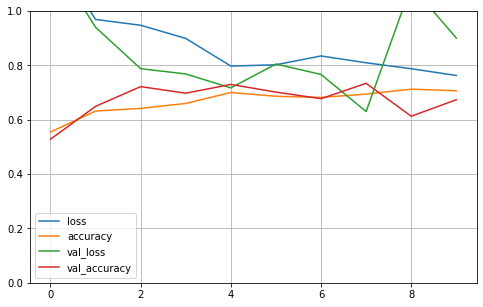

Epoch 1/10
76/76 [==============================] - 7s 95ms/step - loss: 1.5513 - accuracy: 0.4227 - val_loss: 0.9754 - val_accuracy: 0.6417
Epoch 2/10
76/76 [==============================] - 7s 87ms/step - loss: 1.0443 - accuracy: 0.6190 - val_loss: 0.9839 - val_accuracy: 0.6333
Epoch 3/10
76/76 [==============================] - 7s 95ms/step - loss: 0.9013 - accuracy: 0.6595 - val_loss: 0.7771 - val_accuracy: 0.6750
Epoch 4/10
76/76 [==============================] - 7s 97ms/step - loss: 0.9409 - accuracy: 0.6151 - val_loss: 0.8093 - val_accuracy: 0.7083
Epoch 5/10
76/76 [==============================] - 6s 85ms/step - loss: 0.8220 - accuracy: 0.6826 - val_loss: 0.9020 - val_accuracy: 0.6750
Epoch 6/10
76/76 [==============================] - 7s 92ms/step - loss: 0.8867 - accuracy: 0.6661 - val_loss: 0.6980 - val_accuracy: 0.7333
Epoch 7/10
76/76 [==============================] - 7s 93ms/step - loss: 0.8177 - accuracy: 0.6743 - val_loss: 0.7728 - val_accuracy: 0.7333
Epoch 8/10
76

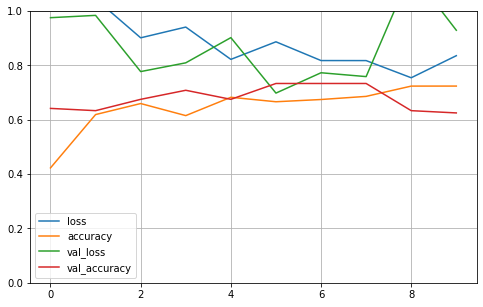

Epoch 1/10
38/38 [==============================] - 4s 107ms/step - loss: 2.1695 - accuracy: 0.2138 - val_loss: 1.5952 - val_accuracy: 0.3036
Epoch 2/10
38/38 [==============================] - 3s 91ms/step - loss: 1.6438 - accuracy: 0.3158 - val_loss: 1.4506 - val_accuracy: 0.4821
Epoch 3/10
38/38 [==============================] - 4s 101ms/step - loss: 1.5355 - accuracy: 0.3849 - val_loss: 1.2916 - val_accuracy: 0.4821
Epoch 4/10
38/38 [==============================] - 3s 80ms/step - loss: 1.2793 - accuracy: 0.5296 - val_loss: 1.0451 - val_accuracy: 0.7143
Epoch 5/10
38/38 [==============================] - 3s 77ms/step - loss: 1.2837 - accuracy: 0.5066 - val_loss: 1.0809 - val_accuracy: 0.5714
Epoch 6/10
38/38 [==============================] - 4s 100ms/step - loss: 1.1759 - accuracy: 0.5362 - val_loss: 0.9573 - val_accuracy: 0.5714
Epoch 7/10
38/38 [==============================] - 4s 100ms/step - loss: 1.1202 - accuracy: 0.5691 - val_loss: 1.0293 - val_accuracy: 0.5357
Epoch 8/1

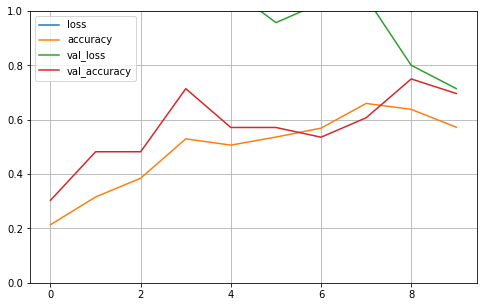

In [10]:
batchSizes = [8,16,32,64]

for bs in batchSizes:
    model = models.Sequential()
    model.add(layers.Conv2D(filters=32, kernel_size=(3,3),activation='relu',input_shape=(64,64,3)))
    model.add(layers.MaxPool2D(pool_size=(2, 2)))
    model.add(layers.Flatten())
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(6, activation='softmax'))
    
    from tensorflow.keras import optimizers
    model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)
    history = model.fit(
    train_gen,
    steps_per_epoch = round(2465/bs)-1,
    epochs=10,
    validation_data=validate_gen,
    validation_steps= round(518/bs)-1,
    batch_size=bs
)
    
    print("Batch Size:", bs)
    pd.DataFrame(history.history).plot(figsize=(8,5))
    plt.grid(True)
    plt.gca().set_ylim(0,1)
    plt.show()

## Optimising Initial Filter Size

Epoch 1/20
307/307 [==============================] - 27s 87ms/step - loss: 1.1569 - accuracy: 0.5504 - val_loss: 1.1053 - val_accuracy: 0.6035
Epoch 2/20
307/307 [==============================] - 26s 86ms/step - loss: 0.8980 - accuracy: 0.6725 - val_loss: 0.9707 - val_accuracy: 0.6270
Epoch 3/20
307/307 [==============================] - 27s 87ms/step - loss: 0.8423 - accuracy: 0.6876 - val_loss: 0.9260 - val_accuracy: 0.6367
Epoch 4/20
307/307 [==============================] - 27s 87ms/step - loss: 0.7989 - accuracy: 0.7097 - val_loss: 0.8409 - val_accuracy: 0.6777
Epoch 5/20
307/307 [==============================] - 27s 88ms/step - loss: 0.7843 - accuracy: 0.7252 - val_loss: 1.0831 - val_accuracy: 0.6309
Epoch 6/20
307/307 [==============================] - 27s 88ms/step - loss: 0.7576 - accuracy: 0.7166 - val_loss: 1.1163 - val_accuracy: 0.6328
Epoch 7/20
307/307 [==============================] - 27s 87ms/step - loss: 0.7834 - accuracy: 0.7052 - val_loss: 1.0813 - val_accuracy:

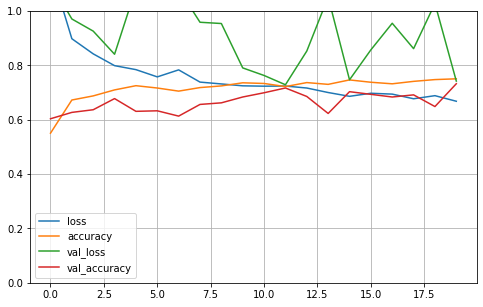

Epoch 1/20
307/307 [==============================] - 29s 93ms/step - loss: 1.2446 - accuracy: 0.5145 - val_loss: 0.9047 - val_accuracy: 0.6426
Epoch 2/20
307/307 [==============================] - 28s 90ms/step - loss: 0.9302 - accuracy: 0.6582 - val_loss: 1.0030 - val_accuracy: 0.6270
Epoch 3/20
307/307 [==============================] - 28s 91ms/step - loss: 0.8626 - accuracy: 0.6884 - val_loss: 0.7825 - val_accuracy: 0.6758
Epoch 4/20
307/307 [==============================] - 28s 90ms/step - loss: 0.8341 - accuracy: 0.6872 - val_loss: 0.8594 - val_accuracy: 0.6914
Epoch 5/20
307/307 [==============================] - 28s 90ms/step - loss: 0.7714 - accuracy: 0.7113 - val_loss: 0.7710 - val_accuracy: 0.7168
Epoch 6/20
307/307 [==============================] - 28s 90ms/step - loss: 0.7487 - accuracy: 0.7170 - val_loss: 0.7207 - val_accuracy: 0.7168
Epoch 7/20
307/307 [==============================] - 28s 90ms/step - loss: 0.7690 - accuracy: 0.7068 - val_loss: 0.7539 - val_accuracy:

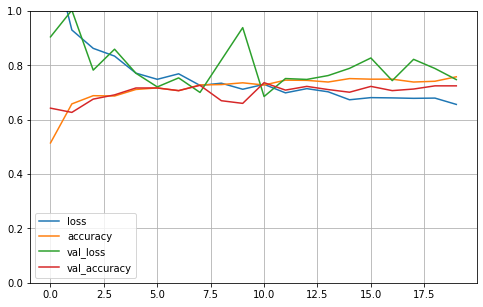

Epoch 1/20
307/307 [==============================] - 28s 93ms/step - loss: 1.2481 - accuracy: 0.5080 - val_loss: 1.0809 - val_accuracy: 0.6133
Epoch 2/20
307/307 [==============================] - 28s 92ms/step - loss: 0.9390 - accuracy: 0.6439 - val_loss: 1.0739 - val_accuracy: 0.6035
Epoch 3/20
307/307 [==============================] - 28s 92ms/step - loss: 0.8710 - accuracy: 0.6688 - val_loss: 0.7614 - val_accuracy: 0.6953
Epoch 4/20
307/307 [==============================] - 28s 92ms/step - loss: 0.8367 - accuracy: 0.6852 - val_loss: 0.7840 - val_accuracy: 0.6914
Epoch 5/20
307/307 [==============================] - 28s 92ms/step - loss: 0.8130 - accuracy: 0.6852 - val_loss: 0.7570 - val_accuracy: 0.7090
Epoch 6/20
307/307 [==============================] - 28s 92ms/step - loss: 0.7815 - accuracy: 0.7072 - val_loss: 0.7599 - val_accuracy: 0.6914
Epoch 7/20
307/307 [==============================] - 28s 93ms/step - loss: 0.7824 - accuracy: 0.7121 - val_loss: 0.7379 - val_accuracy:

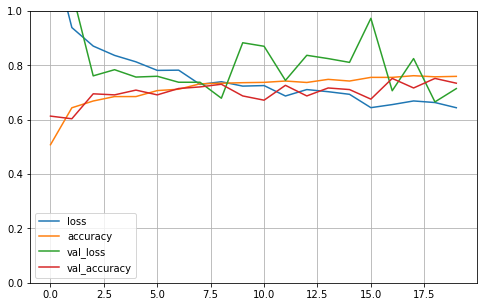

Epoch 1/20
307/307 [==============================] - 31s 100ms/step - loss: 1.1416 - accuracy: 0.5827 - val_loss: 1.2549 - val_accuracy: 0.5820
Epoch 2/20
307/307 [==============================] - 30s 99ms/step - loss: 0.8525 - accuracy: 0.6758 - val_loss: 0.9286 - val_accuracy: 0.6387
Epoch 3/20
307/307 [==============================] - 30s 98ms/step - loss: 0.8474 - accuracy: 0.6827 - val_loss: 0.8970 - val_accuracy: 0.6738
Epoch 4/20
307/307 [==============================] - 30s 98ms/step - loss: 0.7941 - accuracy: 0.7134 - val_loss: 1.0852 - val_accuracy: 0.6133
Epoch 5/20
307/307 [==============================] - 30s 99ms/step - loss: 0.7800 - accuracy: 0.6970 - val_loss: 0.9242 - val_accuracy: 0.6738
Epoch 6/20
307/307 [==============================] - 30s 99ms/step - loss: 0.7596 - accuracy: 0.7146 - val_loss: 0.9292 - val_accuracy: 0.6660
Epoch 7/20
307/307 [==============================] - 30s 98ms/step - loss: 0.7530 - accuracy: 0.7232 - val_loss: 0.7665 - val_accuracy

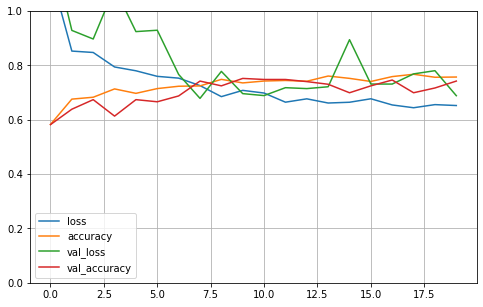

Epoch 1/20
307/307 [==============================] - 36s 117ms/step - loss: 1.2248 - accuracy: 0.5778 - val_loss: 0.9186 - val_accuracy: 0.6348
Epoch 2/20
307/307 [==============================] - 35s 114ms/step - loss: 0.8989 - accuracy: 0.6652 - val_loss: 1.0525 - val_accuracy: 0.6270
Epoch 3/20
307/307 [==============================] - 35s 113ms/step - loss: 0.8625 - accuracy: 0.6807 - val_loss: 0.7585 - val_accuracy: 0.7031
Epoch 4/20
307/307 [==============================] - 35s 114ms/step - loss: 0.8183 - accuracy: 0.6917 - val_loss: 0.8211 - val_accuracy: 0.6914
Epoch 5/20
307/307 [==============================] - 35s 114ms/step - loss: 0.7913 - accuracy: 0.7076 - val_loss: 1.0146 - val_accuracy: 0.6387
Epoch 6/20
307/307 [==============================] - 35s 113ms/step - loss: 0.7676 - accuracy: 0.7146 - val_loss: 0.7386 - val_accuracy: 0.7070
Epoch 7/20
307/307 [==============================] - 35s 114ms/step - loss: 0.7451 - accuracy: 0.7281 - val_loss: 0.7326 - val_ac

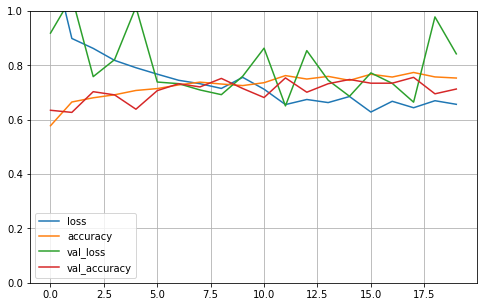

In [48]:
filterSizes = [8,16,32,64, 128]

for fs in filterSizes:
    model = models.Sequential()
    model.add(layers.Conv2D(filters=fs, kernel_size=(3,3),activation='relu',input_shape=(64,64,3)))
    model.add(layers.MaxPool2D(pool_size=(2, 2)))
    model.add(layers.Flatten())
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(6, activation='softmax'))
    
    from tensorflow.keras import optimizers
    model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)
    history = model.fit(
    train_gen,
    steps_per_epoch = round(2465/8)-1,
    epochs=20,
    validation_data=validate_gen,
    validation_steps= round(518/8)-1,
    batch_size=8
)
    
    print("Filter Size", fs)
    pd.DataFrame(history.history).plot(figsize=(8,5))
    plt.grid(True)
    plt.gca().set_ylim(0,1)
    plt.show()

## Optimising Density

Epoch 1/10
38/38 [==============================] - 3s 86ms/step - loss: 1.8749 - accuracy: 0.2467 - val_loss: 1.7580 - val_accuracy: 0.4286
Epoch 2/10
38/38 [==============================] - 4s 97ms/step - loss: 1.7247 - accuracy: 0.2928 - val_loss: 1.7031 - val_accuracy: 0.3929
Epoch 3/10
38/38 [==============================] - 3s 73ms/step - loss: 1.6698 - accuracy: 0.3454 - val_loss: 1.7040 - val_accuracy: 0.3036
Epoch 4/10
38/38 [==============================] - 3s 81ms/step - loss: 1.7152 - accuracy: 0.3586 - val_loss: 1.5958 - val_accuracy: 0.2857
Epoch 5/10
38/38 [==============================] - 3s 84ms/step - loss: 1.6255 - accuracy: 0.3586 - val_loss: 1.7182 - val_accuracy: 0.3571
Epoch 6/10
38/38 [==============================] - 3s 87ms/step - loss: 1.5790 - accuracy: 0.3717 - val_loss: 1.6047 - val_accuracy: 0.4464
Epoch 7/10
38/38 [==============================] - 4s 117ms/step - loss: 1.6640 - accuracy: 0.3520 - val_loss: 1.5255 - val_accuracy: 0.5179
Epoch 8/10
3

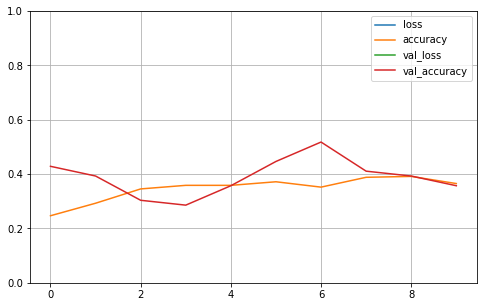

Epoch 1/10
38/38 [==============================] - 3s 87ms/step - loss: 2.3177 - accuracy: 0.2566 - val_loss: 1.6303 - val_accuracy: 0.3393
Epoch 2/10
38/38 [==============================] - 3s 82ms/step - loss: 1.6087 - accuracy: 0.3257 - val_loss: 1.5669 - val_accuracy: 0.3214
Epoch 3/10
38/38 [==============================] - 3s 72ms/step - loss: 1.5290 - accuracy: 0.3388 - val_loss: 1.3068 - val_accuracy: 0.4643
Epoch 4/10
38/38 [==============================] - 4s 94ms/step - loss: 1.4687 - accuracy: 0.3502 - val_loss: 1.2351 - val_accuracy: 0.5357
Epoch 5/10
38/38 [==============================] - 4s 96ms/step - loss: 1.4663 - accuracy: 0.3454 - val_loss: 1.2459 - val_accuracy: 0.4107
Epoch 6/10
38/38 [==============================] - 4s 101ms/step - loss: 1.3945 - accuracy: 0.4441 - val_loss: 1.2359 - val_accuracy: 0.4643
Epoch 7/10
38/38 [==============================] - 3s 82ms/step - loss: 1.3519 - accuracy: 0.4572 - val_loss: 1.2964 - val_accuracy: 0.5714
Epoch 8/10
3

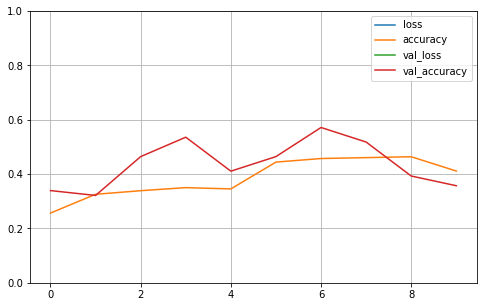

Epoch 1/10
38/38 [==============================] - 4s 105ms/step - loss: 2.0379 - accuracy: 0.3098 - val_loss: 1.4213 - val_accuracy: 0.3036
Epoch 2/10
38/38 [==============================] - 3s 88ms/step - loss: 1.2967 - accuracy: 0.5132 - val_loss: 1.6123 - val_accuracy: 0.3393
Epoch 3/10
38/38 [==============================] - 3s 82ms/step - loss: 1.1945 - accuracy: 0.5033 - val_loss: 0.9883 - val_accuracy: 0.6250
Epoch 4/10
38/38 [==============================] - 3s 81ms/step - loss: 0.9486 - accuracy: 0.6513 - val_loss: 1.3431 - val_accuracy: 0.5357
Epoch 5/10
38/38 [==============================] - 4s 102ms/step - loss: 1.0930 - accuracy: 0.5757 - val_loss: 0.7647 - val_accuracy: 0.7143
Epoch 6/10
38/38 [==============================] - 3s 79ms/step - loss: 0.9285 - accuracy: 0.6513 - val_loss: 1.1362 - val_accuracy: 0.6964
Epoch 7/10
38/38 [==============================] - 4s 104ms/step - loss: 0.8796 - accuracy: 0.6447 - val_loss: 1.1728 - val_accuracy: 0.6250
Epoch 8/10

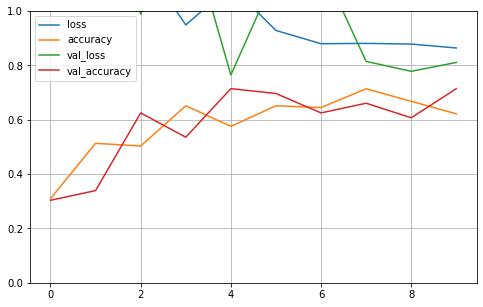

Epoch 1/10
38/38 [==============================] - 4s 101ms/step - loss: 1.7764 - accuracy: 0.3651 - val_loss: 1.5046 - val_accuracy: 0.4107
Epoch 2/10
38/38 [==============================] - 4s 96ms/step - loss: 1.1877 - accuracy: 0.5428 - val_loss: 1.0873 - val_accuracy: 0.5536
Epoch 3/10
38/38 [==============================] - 4s 98ms/step - loss: 1.0776 - accuracy: 0.6020 - val_loss: 0.9448 - val_accuracy: 0.6607
Epoch 4/10
38/38 [==============================] - 3s 91ms/step - loss: 1.0605 - accuracy: 0.6151 - val_loss: 0.8868 - val_accuracy: 0.6607
Epoch 5/10
38/38 [==============================] - 4s 102ms/step - loss: 0.9627 - accuracy: 0.6229 - val_loss: 0.8903 - val_accuracy: 0.6250
Epoch 6/10
38/38 [==============================] - 3s 92ms/step - loss: 0.9191 - accuracy: 0.6579 - val_loss: 0.6996 - val_accuracy: 0.6964
Epoch 7/10
38/38 [==============================] - 4s 106ms/step - loss: 0.8971 - accuracy: 0.6842 - val_loss: 0.6904 - val_accuracy: 0.7500
Epoch 8/10

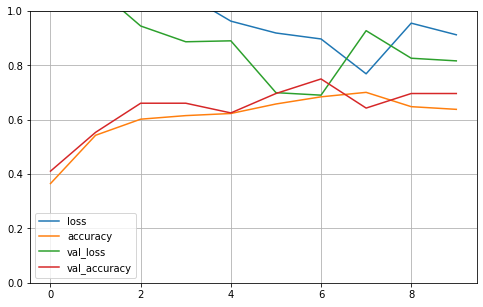

In [23]:
density = [32,64,128,256]

for ds in density:
    model = models.Sequential()
    model.add(layers.Conv2D(filters=16, kernel_size=(3,3),activation='relu',input_shape=(64,64,3)))
    model.add(layers.MaxPool2D(pool_size=(2, 2)))
    model.add(layers.Flatten())
    model.add(layers.Dense(ds, activation='relu'))
    model.add(layers.Dense(6, activation='softmax'))
    
    from tensorflow.keras import optimizers
    model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)
    history = model.fit(
    train_gen,
    steps_per_epoch = round(2465/bs)-1,
    epochs=20,
    validation_data=validate_gen,
    validation_steps= round(518/bs)-1,
    batch_size=8
)
    
    print("Density:", ds)
    pd.DataFrame(history.history).plot(figsize=(8,5))
    plt.grid(True)
    plt.gca().set_ylim(0,1)
    plt.show()

## Testing Deeper CNN
### 2 Layers:

Epoch 1/20
307/307 [==============================] - 28s 91ms/step - loss: 1.1495 - accuracy: 0.5428 - val_loss: 1.0333 - val_accuracy: 0.5938
Epoch 2/20
307/307 [==============================] - 28s 90ms/step - loss: 0.8560 - accuracy: 0.6782 - val_loss: 0.7048 - val_accuracy: 0.7207
Epoch 3/20
307/307 [==============================] - 28s 92ms/step - loss: 0.7859 - accuracy: 0.7060 - val_loss: 0.7159 - val_accuracy: 0.7305
Epoch 4/20
307/307 [==============================] - 28s 91ms/step - loss: 0.7483 - accuracy: 0.7101 - val_loss: 0.8250 - val_accuracy: 0.7031
Epoch 5/20
307/307 [==============================] - 28s 91ms/step - loss: 0.7246 - accuracy: 0.7268 - val_loss: 0.8608 - val_accuracy: 0.6816
Epoch 6/20
307/307 [==============================] - 28s 91ms/step - loss: 0.7001 - accuracy: 0.7394 - val_loss: 0.6912 - val_accuracy: 0.7383
Epoch 7/20
307/307 [==============================] - 28s 90ms/step - loss: 0.6869 - accuracy: 0.7546 - val_loss: 0.9364 - val_accuracy:

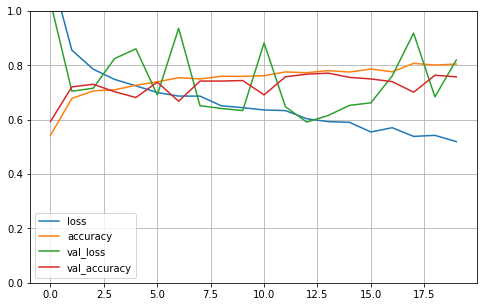

In [35]:
model = models.Sequential()
model.add(layers.Conv2D(filters=16, kernel_size=(3,3),activation='relu',input_shape=(64,64,3)))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=16, kernel_size=(3,3),activation='relu',input_shape=(64,64,3)))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(6, activation='softmax'))

from tensorflow.keras import optimizers
model.compile(
loss='categorical_crossentropy',
optimizer='adam',
metrics=['accuracy']
)
history = model.fit(
train_gen,
steps_per_epoch = round(2465/8)-1,
epochs=20,
validation_data=validate_gen,
validation_steps= round(518/8)-1,
batch_size=8
)
    
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.grid(True)
plt.gca().set_ylim(0,1)
plt.show()

### 3 layers

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(filters=16, kernel_size=(3,3),activation='relu',input_shape=(64,64,3)))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=32, kernel_size=(3,3),activation='relu',input_shape=(64,64,3)))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=64, kernel_size=(3,3),activation='relu',input_shape=(64,64,3)))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(6, activation='softmax'))

from tensorflow.keras import optimizers
model.compile(
loss='categorical_crossentropy',
optimizer='adam',
metrics=['accuracy']
)
history = model.fit(
train_gen,
steps_per_epoch = round(2465/8)-1,
epochs=20,
validation_data=validate_gen,
validation_steps= round(518/8)-1,
batch_size=8
)
    
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.grid(True)
plt.gca().set_ylim(0,1)
plt.show()

Epoch 1/20
307/307 [==============================] - 30s 98ms/step - loss: 1.1186 - accuracy: 0.5602 - val_loss: 0.8077 - val_accuracy: 0.6719
Epoch 2/20
307/307 [==============================] - 30s 97ms/step - loss: 0.8552 - accuracy: 0.6795 - val_loss: 0.8242 - val_accuracy: 0.6836
Epoch 3/20
307/307 [==============================] - 30s 97ms/step - loss: 0.8211 - accuracy: 0.6946 - val_loss: 0.7661 - val_accuracy: 0.7188
Epoch 4/20
307/307 [==============================] - 30s 97ms/step - loss: 0.7728 - accuracy: 0.7064 - val_loss: 0.9386 - val_accuracy: 0.6230
Epoch 5/20
307/307 [==============================] - 30s 97ms/step - loss: 0.7350 - accuracy: 0.7162 - val_loss: 1.1477 - val_accuracy: 0.6289
Epoch 6/20
307/307 [==============================] - 30s 97ms/step - loss: 0.7367 - accuracy: 0.7170 - val_loss: 0.7892 - val_accuracy: 0.6895
Epoch 7/20
307/307 [==============================] - 30s 96ms/step - loss: 0.6961 - accuracy: 0.7313 - val_loss: 0.7557 - val_accuracy:

## Optimising Total Epochs

Epoch 1/20
307/307 [==============================] - 28s 93ms/step - loss: 1.1168 - accuracy: 0.5529 - val_loss: 1.1357 - val_accuracy: 0.5781
Epoch 2/20
307/307 [==============================] - 28s 92ms/step - loss: 0.8490 - accuracy: 0.6819 - val_loss: 1.1508 - val_accuracy: 0.5898
Epoch 3/20
307/307 [==============================] - 28s 92ms/step - loss: 0.8014 - accuracy: 0.6966 - val_loss: 0.8404 - val_accuracy: 0.6738
Epoch 4/20
307/307 [==============================] - 28s 92ms/step - loss: 0.7607 - accuracy: 0.7040 - val_loss: 0.7570 - val_accuracy: 0.7168
Epoch 5/20
307/307 [==============================] - 28s 92ms/step - loss: 0.7419 - accuracy: 0.7138 - val_loss: 0.7242 - val_accuracy: 0.7324
Epoch 6/20
307/307 [==============================] - 28s 92ms/step - loss: 0.7138 - accuracy: 0.7432 - val_loss: 1.3895 - val_accuracy: 0.5723
Epoch 7/20
307/307 [==============================] - 28s 91ms/step - loss: 0.7351 - accuracy: 0.7158 - val_loss: 0.7119 - val_accuracy:

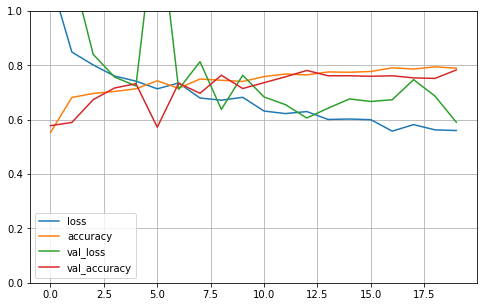

Epoch 1/50
307/307 [==============================] - 28s 92ms/step - loss: 1.1804 - accuracy: 0.5329 - val_loss: 0.9064 - val_accuracy: 0.6504
Epoch 2/50
307/307 [==============================] - 28s 92ms/step - loss: 0.8871 - accuracy: 0.6607 - val_loss: 0.8800 - val_accuracy: 0.6562
Epoch 3/50
307/307 [==============================] - 28s 92ms/step - loss: 0.8142 - accuracy: 0.7003 - val_loss: 0.9697 - val_accuracy: 0.6289
Epoch 4/50
307/307 [==============================] - 28s 91ms/step - loss: 0.7763 - accuracy: 0.7142 - val_loss: 0.8776 - val_accuracy: 0.6719
Epoch 5/50
307/307 [==============================] - 28s 91ms/step - loss: 0.7450 - accuracy: 0.7207 - val_loss: 0.7285 - val_accuracy: 0.7188
Epoch 6/50
307/307 [==============================] - 28s 92ms/step - loss: 0.7344 - accuracy: 0.7256 - val_loss: 0.9209 - val_accuracy: 0.6426
Epoch 7/50
307/307 [==============================] - 28s 93ms/step - loss: 0.6977 - accuracy: 0.7383 - val_loss: 0.7495 - val_accuracy:

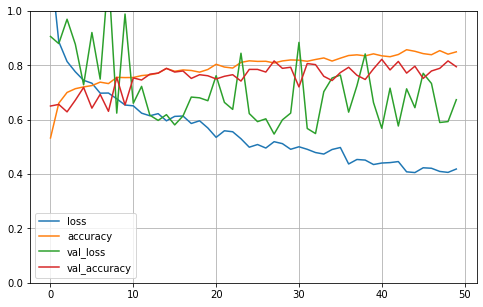

Epoch 1/75
307/307 [==============================] - 28s 92ms/step - loss: 1.1348 - accuracy: 0.5696 - val_loss: 0.9494 - val_accuracy: 0.6641
Epoch 2/75
307/307 [==============================] - 28s 92ms/step - loss: 0.8462 - accuracy: 0.6823 - val_loss: 0.8987 - val_accuracy: 0.6855
Epoch 3/75
307/307 [==============================] - 28s 91ms/step - loss: 0.7899 - accuracy: 0.7101 - val_loss: 0.7241 - val_accuracy: 0.7402
Epoch 4/75
307/307 [==============================] - 28s 92ms/step - loss: 0.7394 - accuracy: 0.7334 - val_loss: 0.8370 - val_accuracy: 0.6875
Epoch 5/75
307/307 [==============================] - 28s 92ms/step - loss: 0.7317 - accuracy: 0.7236 - val_loss: 1.0038 - val_accuracy: 0.6367
Epoch 6/75
307/307 [==============================] - 28s 92ms/step - loss: 0.7185 - accuracy: 0.7321 - val_loss: 0.6373 - val_accuracy: 0.7520
Epoch 7/75
307/307 [==============================] - 28s 91ms/step - loss: 0.6949 - accuracy: 0.7432 - val_loss: 0.8653 - val_accuracy:

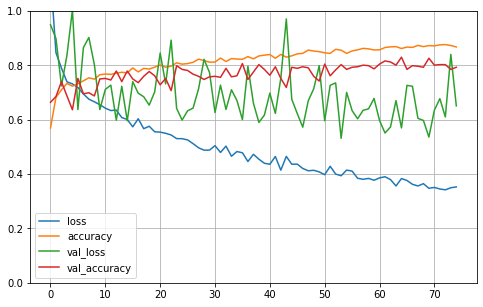

Epoch 1/100
307/307 [==============================] - 29s 93ms/step - loss: 1.1671 - accuracy: 0.5182 - val_loss: 0.9360 - val_accuracy: 0.6445
Epoch 2/100
307/307 [==============================] - 28s 92ms/step - loss: 0.8680 - accuracy: 0.6652 - val_loss: 0.8528 - val_accuracy: 0.6738
Epoch 3/100
307/307 [==============================] - 28s 91ms/step - loss: 0.8362 - accuracy: 0.6889 - val_loss: 0.7757 - val_accuracy: 0.6660
Epoch 4/100
307/307 [==============================] - 28s 91ms/step - loss: 0.7488 - accuracy: 0.7178 - val_loss: 0.8356 - val_accuracy: 0.6914
Epoch 5/100
307/307 [==============================] - 28s 92ms/step - loss: 0.7548 - accuracy: 0.7203 - val_loss: 0.7511 - val_accuracy: 0.6855
Epoch 6/100
307/307 [==============================] - 28s 92ms/step - loss: 0.7382 - accuracy: 0.7297 - val_loss: 0.6894 - val_accuracy: 0.7402
Epoch 7/100
307/307 [==============================] - 28s 93ms/step - loss: 0.7011 - accuracy: 0.7330 - val_loss: 0.7925 - val_ac

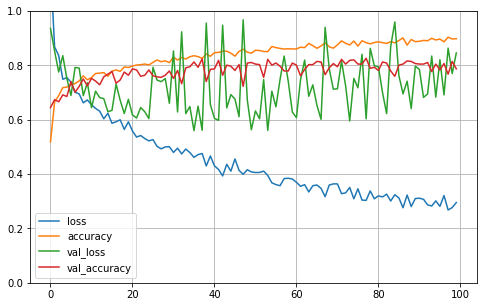

In [36]:
epochs = [20,50,75,100]

for ep in epochs:
    model = models.Sequential()
    model.add(layers.Conv2D(filters=16, kernel_size=(3,3),activation='relu',input_shape=(64,64,3)))
    model.add(layers.MaxPool2D(pool_size=(2, 2)))
    model.add(layers.Conv2D(filters=32, kernel_size=(3,3),activation='relu',input_shape=(64,64,3)))
    model.add(layers.MaxPool2D(pool_size=(2, 2)))
    model.add(layers.Dropout(rate=0.5))
    model.add(layers.Flatten())
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.Dense(6, activation='softmax'))
    
    from tensorflow.keras import optimizers
    model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)
    history = model.fit(
    train_gen,
    steps_per_epoch = round(2465/8)-1,
    epochs=ep,
    validation_data=validate_gen,
    validation_steps= round(518/8)-1,
    batch_size=8
)
    
    print("Epochs:", ep)
    # summarize history for accuracy
    pd.DataFrame(history.history).plot(figsize=(8,5))
    plt.grid(True)
    plt.gca().set_ylim(0,1)
    plt.show()

## Final Model

Epoch 1/80
307/307 [==============================] - 28s 92ms/step - loss: 1.2302 - accuracy: 0.5059 - val_loss: 1.0242 - val_accuracy: 0.6309
Epoch 2/80
307/307 [==============================] - 28s 92ms/step - loss: 0.8703 - accuracy: 0.6754 - val_loss: 0.8198 - val_accuracy: 0.6777
Epoch 3/80
307/307 [==============================] - 28s 92ms/step - loss: 0.8104 - accuracy: 0.7056 - val_loss: 0.8407 - val_accuracy: 0.6895
Epoch 4/80
307/307 [==============================] - 28s 92ms/step - loss: 0.7966 - accuracy: 0.7023 - val_loss: 1.0065 - val_accuracy: 0.6250
Epoch 5/80
307/307 [==============================] - 28s 92ms/step - loss: 0.7403 - accuracy: 0.7264 - val_loss: 0.8524 - val_accuracy: 0.6719
Epoch 6/80
307/307 [==============================] - 28s 92ms/step - loss: 0.7195 - accuracy: 0.7334 - val_loss: 0.8449 - val_accuracy: 0.6621
Epoch 7/80
307/307 [==============================] - 28s 92ms/step - loss: 0.6951 - accuracy: 0.7456 - val_loss: 0.7902 - val_accuracy:

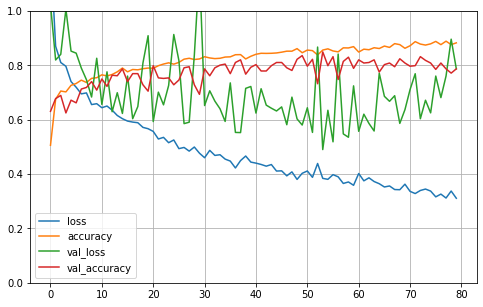

In [6]:
model = models.Sequential()
model.add(layers.Conv2D(filters=16, kernel_size=(3,3),activation='relu',input_shape=(64,64,3)))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=32, kernel_size=(3,3),activation='relu',input_shape=(64,64,3)))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Dropout(rate=0.5))
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(6, activation='softmax'))

from tensorflow.keras import optimizers
model.compile(
loss='categorical_crossentropy',
optimizer='adam',
metrics=['accuracy']
)
history = model.fit(
train_gen,
steps_per_epoch = round(2465/8)-1,
epochs=80,
validation_data=validate_gen,
validation_steps= round(518/8)-1,
batch_size=8
)


pd.DataFrame(history.history).plot(figsize=(8,5))
plt.grid(True)
plt.gca().set_ylim(0,1)
plt.show()

In [7]:
model.save("model.t1")

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: model.t1\assets


In [8]:
model = keras.models.load_model('model.t1')

## Model Performance

In [9]:
model.evaluate(test_gen, steps = 1)

1/1 [==============================] - 0s 0s/step - loss: 1.0019 - accuracy: 0.7273


[1.0019465684890747, 0.7272727489471436]

In [12]:
predictions = model.predict_generator(test_gen, steps=1)

predicted_classes = np.argmax(predictions, axis=1)

true_classes = test_gen.classes
class_labels = list(test_gen.class_indices.keys()) 

report = metrics.classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)   

              precision    recall  f1-score   support

      banana       0.67      1.00      0.80         4
    brocolli       1.00      1.00      1.00         5
   croissant       1.00      0.50      0.67        10
       pasta       0.38      0.50      0.43         6
        pork       0.64      0.90      0.75        10
        rice       0.86      0.60      0.71        10

    accuracy                           0.71        45
   macro avg       0.76      0.75      0.73        45
weighted avg       0.78      0.71      0.71        45



## Testing final model on unseen data

Instructions for updating:
Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
banana


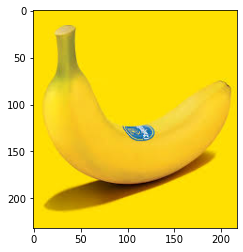

banana


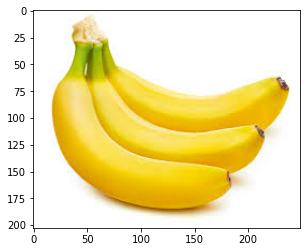

banana


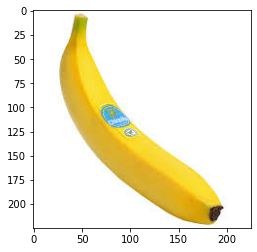

brocolli


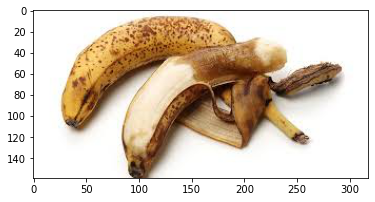

brocolli


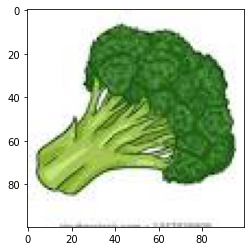

brocolli


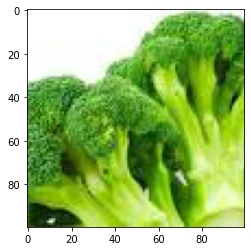

brocolli


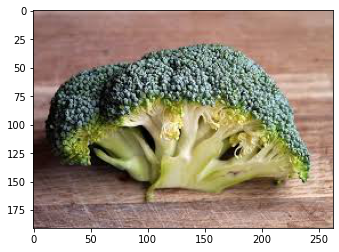

brocolli


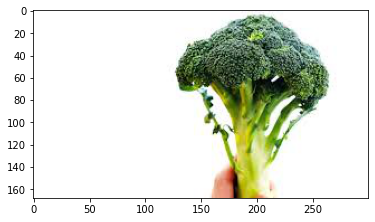

pasta


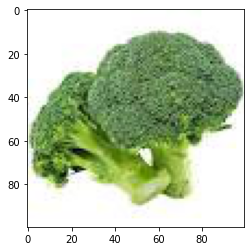

pork


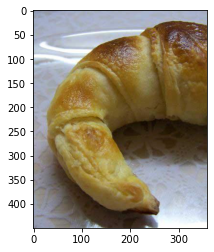

croissant


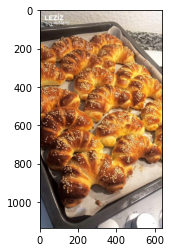

pork


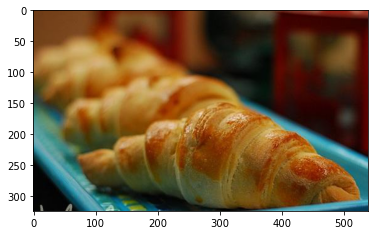

pasta


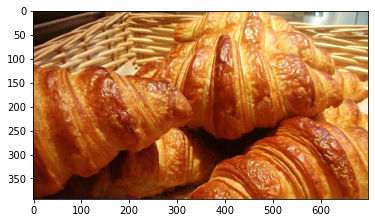

croissant


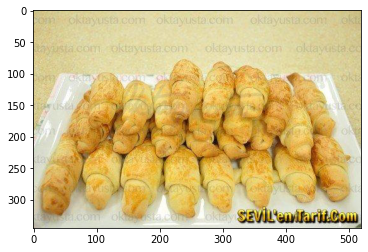

croissant


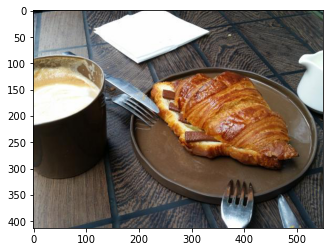

croissant


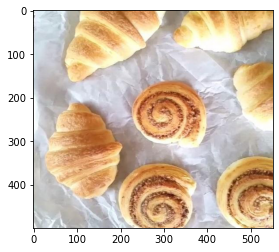

croissant


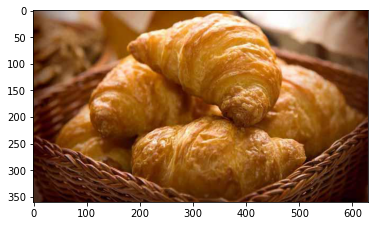

pasta


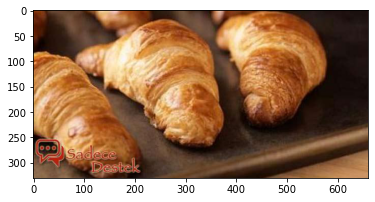

pasta


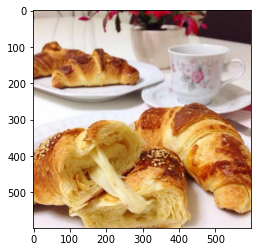

pasta


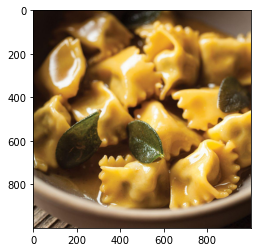

pasta


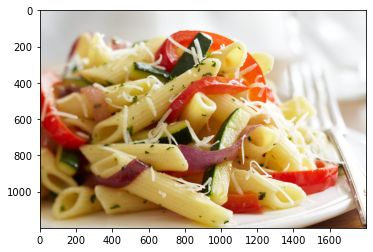

pork


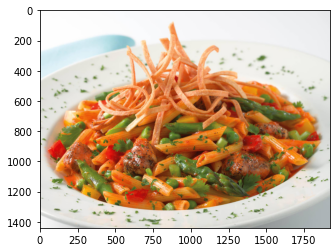

pork


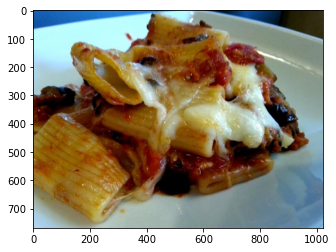

pork


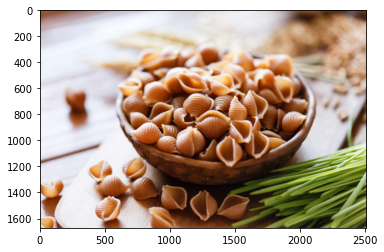

pork


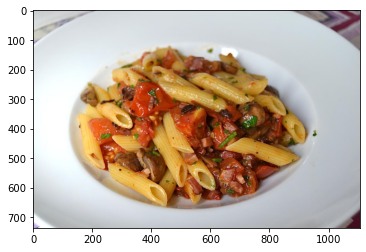

rice


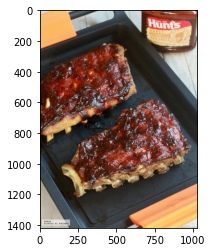

pork


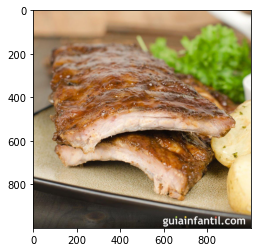

pork


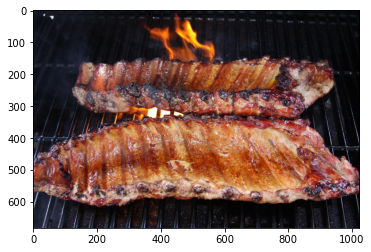

pork


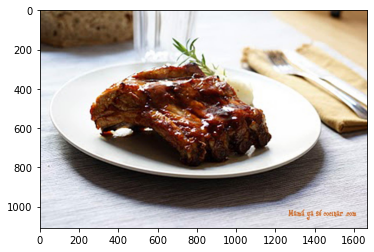

pork


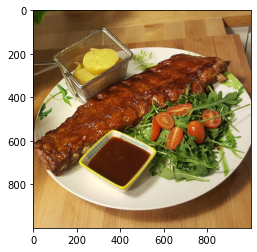

pork


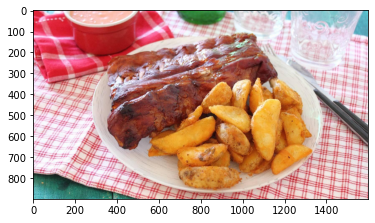

pork


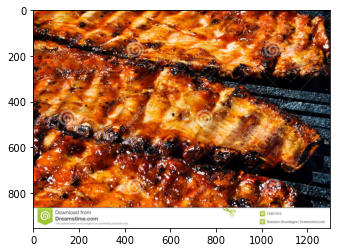

pork


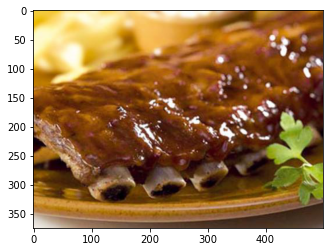

pork


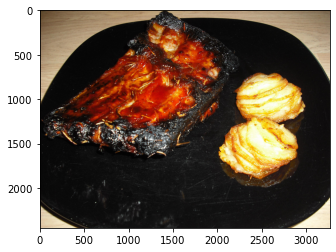

rice


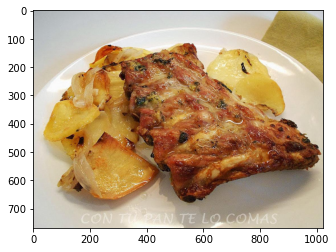

rice


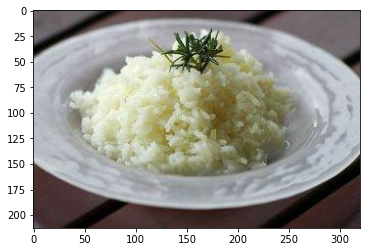

rice


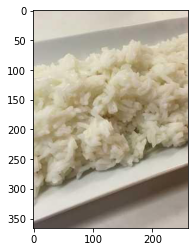

pasta


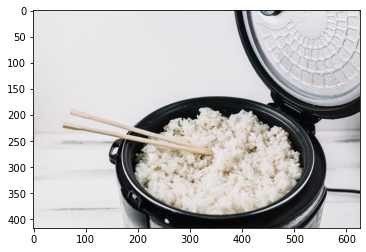

rice


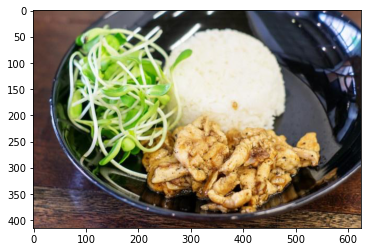

banana


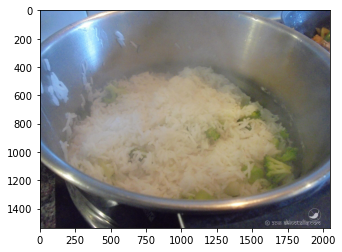

rice


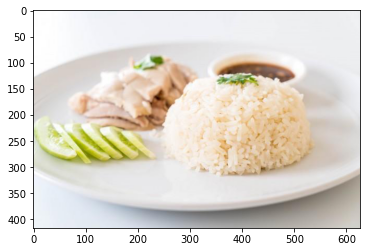

pasta


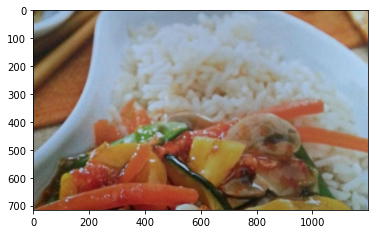

rice


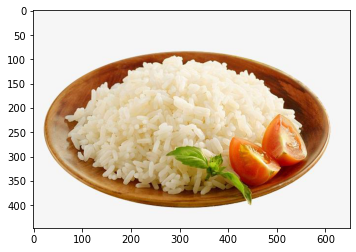

banana


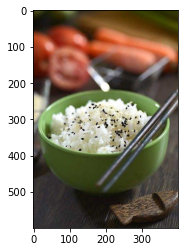

IndexError: index 45 is out of bounds for axis 0 with size 45

In [13]:
i = 1
result = model.predict_classes(test_gen)
for filename in glob.glob('images/test/banana/*.jpg'):
    if result[i]==0:
        print("banana")
    elif result[i]==1:
        print("brocolli")
    elif result[i]==2:
        print("croissant")
    elif result[i]==3:
        print("pasta")
    elif result[i]==4:
        print("pork")
    elif result[i]==5:
        print("rice")
        
    im=Image.open(filename)
    plt.imshow(im)
    plt.show()
    i=i+1
    
for filename in glob.glob('images/test/brocolli/*.jpg'):
    if result[i]==0:
        print("banana")
    elif result[i]==1:
        print("brocolli")
    elif result[i]==2:
        print("croissant")
    elif result[i]==3:
        print("pasta")
    elif result[i]==4:
        print("pork")
    elif result[i]==5:
        print("rice")
        
    im=Image.open(filename)
    plt.imshow(im)
    plt.show()
    i=i+1
    
for filename in glob.glob('images/test/croissant/*.jpg'):
    if result[i]==0:
        print("banana")
    elif result[i]==1:
        print("brocolli")
    elif result[i]==2:
        print("croissant")
    elif result[i]==3:
        print("pasta")
    elif result[i]==4:
        print("pork")
    elif result[i]==5:
        print("rice")
        
    im=Image.open(filename)
    plt.imshow(im)
    plt.show()
    i=i+1
    
for filename in glob.glob('images/test/pasta/*.jpg'):
    if result[i]==0:
        print("banana")
    elif result[i]==1:
        print("brocolli")
    elif result[i]==2:
        print("croissant")
    elif result[i]==3:
        print("pasta")
    elif result[i]==4:
        print("pork")
    elif result[i]==5:
        print("rice")
        
    im=Image.open(filename)
    plt.imshow(im)
    plt.show()
    i=i+1
    
for filename in glob.glob('images/test/pork/*.jpg'):
    if result[i]==0:
        print("banana")
    elif result[i]==1:
        print("brocolli")
    elif result[i]==2:
        print("croissant")
    elif result[i]==3:
        print("pasta")
    elif result[i]==4:
        print("pork")
    elif result[i]==5:
        print("rice")
        
    im=Image.open(filename)
    plt.imshow(im)
    plt.show()
    i=i+1
    
for filename in glob.glob('images/test/rice/*.jpg'):
    if result[i]==0:
        print("banana")
    elif result[i]==1:
        print("brocolli")
    elif result[i]==2:
        print("croissant")
    elif result[i]==3:
        print("pasta")
    elif result[i]==4:
        print("pork")
    elif result[i]==5:
        print("rice")
        
    im=Image.open(filename)
    plt.imshow(im)
    plt.show()
    i=i+1

## Implementing VGG-16

In [33]:
from tensorflow.keras.applications import VGG16

conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(100,100,3))

In [34]:
model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))

model.add(layers.Dense(6, activation='softmax'))

In [18]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 2, 2, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 2048)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               524544    
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 6)                 1542      
Total params: 15,240,774
Trainable params: 15,240,774
Non-trainable params: 0
_________________________________________________________________


In [35]:
from tensorflow.keras import optimizers
model.compile(
loss='categorical_crossentropy',
optimizer=optimizers.RMSprop(lr=2e-5),
metrics=['accuracy']
)

Epoch 1/10
307/307 [==============================] - 183s 596ms/step - loss: 0.7966 - accuracy: 0.7191 - val_loss: 0.3265 - val_accuracy: 0.8906
Epoch 2/10
307/307 [==============================] - 185s 601ms/step - loss: 0.3792 - accuracy: 0.8726 - val_loss: 0.3550 - val_accuracy: 0.8945
Epoch 3/10
307/307 [==============================] - 184s 600ms/step - loss: 0.3137 - accuracy: 0.8934 - val_loss: 0.2969 - val_accuracy: 0.9121
Epoch 4/10
307/307 [==============================] - 185s 601ms/step - loss: 0.2430 - accuracy: 0.9261 - val_loss: 0.2916 - val_accuracy: 0.9199
Epoch 5/10
307/307 [==============================] - 187s 608ms/step - loss: 0.2027 - accuracy: 0.9388 - val_loss: 0.4270 - val_accuracy: 0.8730
Epoch 6/10
307/307 [==============================] - 185s 601ms/step - loss: 0.1851 - accuracy: 0.9383 - val_loss: 0.3014 - val_accuracy: 0.9277
Epoch 7/10
307/307 [==============================] - 183s 596ms/step - loss: 0.1532 - accuracy: 0.9539 - val_loss: 0.9388 -

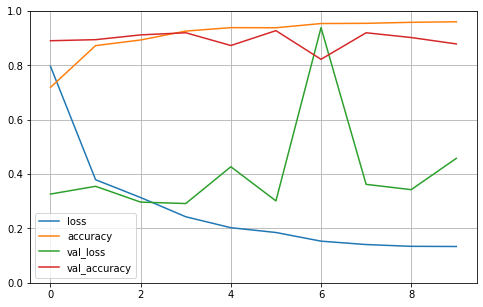

In [38]:
history = model.fit(
train_gen,
steps_per_epoch = round(2465/8)-1,
epochs=10,
validation_data=validate_gen,
validation_steps= round(518/8)-1,
batch_size=8
)


pd.DataFrame(history.history).plot(figsize=(8,5))
plt.grid(True)
plt.gca().set_ylim(0,1)
plt.show()

Epoch 1/10
38/38 [==============================] - 22s 567ms/step - loss: 0.1122 - accuracy: 0.9798 - val_loss: 0.6106 - val_accuracy: 0.8750
Epoch 2/10
38/38 [==============================] - 22s 583ms/step - loss: 0.0836 - accuracy: 0.9605 - val_loss: 1.1502 - val_accuracy: 0.8036
Epoch 3/10
38/38 [==============================] - 23s 600ms/step - loss: 0.0958 - accuracy: 0.9770 - val_loss: 0.4987 - val_accuracy: 0.8750
Epoch 4/10
38/38 [==============================] - 23s 596ms/step - loss: 0.1148 - accuracy: 0.9803 - val_loss: 0.4952 - val_accuracy: 0.8929
Epoch 5/10
38/38 [==============================] - 23s 596ms/step - loss: 0.0664 - accuracy: 0.9803 - val_loss: 0.3722 - val_accuracy: 0.9107
Epoch 6/10
38/38 [==============================] - 22s 583ms/step - loss: 0.1297 - accuracy: 0.9539 - val_loss: 0.2631 - val_accuracy: 0.8929
Epoch 7/10
38/38 [==============================] - 22s 577ms/step - loss: 0.0667 - accuracy: 0.9731 - val_loss: 1.0291 - val_accuracy: 0.8036

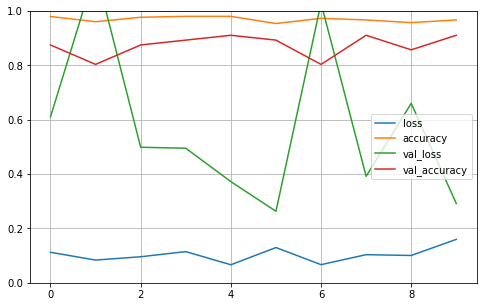

In [40]:
history = model.fit(
train_gen,
steps_per_epoch = round(2465/64)-1,
epochs=10,
validation_data=validate_gen,
validation_steps= round(518/64)-1,
batch_size=8
)


pd.DataFrame(history.history).plot(figsize=(8,5))
plt.grid(True)
plt.gca().set_ylim(0,1)
plt.show()

## Testing VGG16 Model

In [42]:
model.save("model.t2")

INFO:tensorflow:Assets written to: model.t2\assets


In [43]:
model = keras.models.load_model('model.t2')

In [44]:
model.evaluate(test_gen, steps = 1)

1/1 [==============================] - 0s 16ms/step - loss: 1.1754 - accuracy: 0.7111


[1.1753822565078735, 0.7111111283302307]

banana


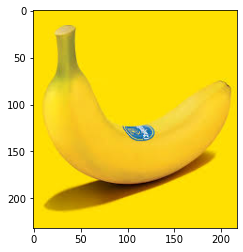

banana


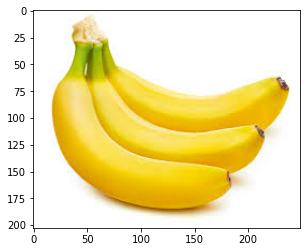

croissant


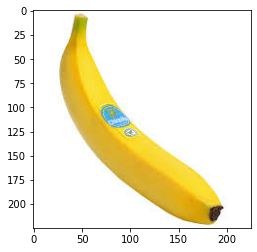

brocolli


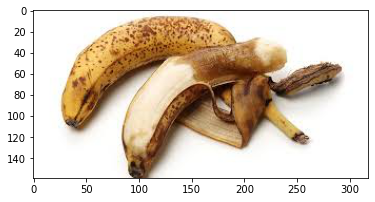

banana


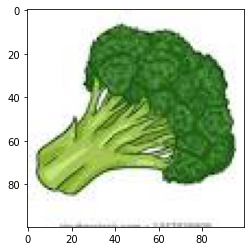

banana


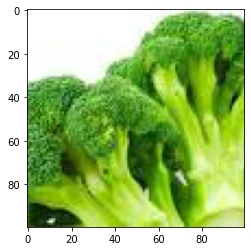

pasta


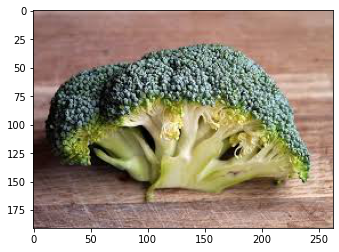

brocolli


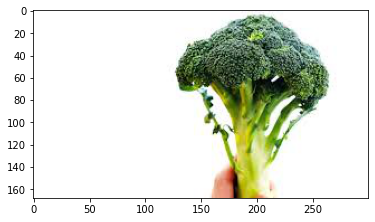

croissant


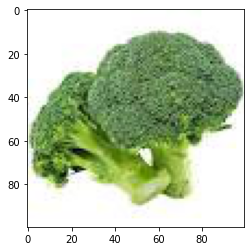

pasta


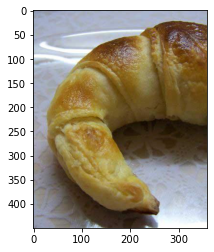

croissant


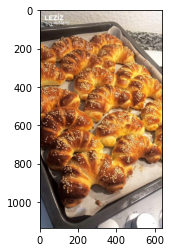

croissant


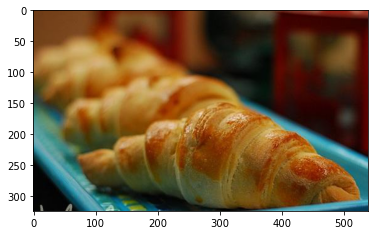

pasta


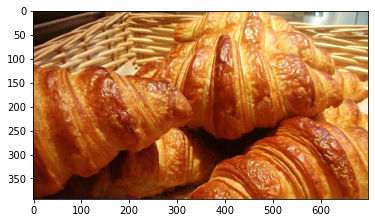

croissant


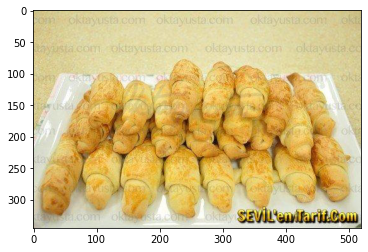

croissant


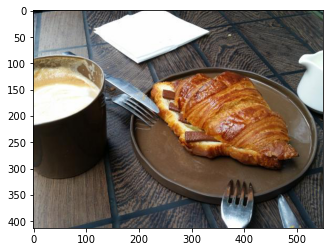

croissant


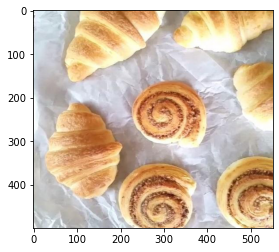

croissant


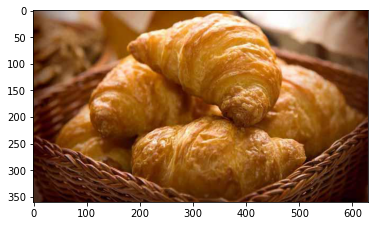

croissant


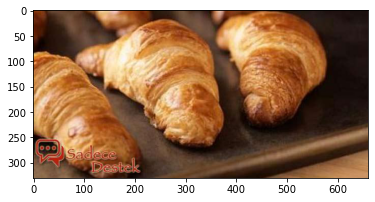

pasta


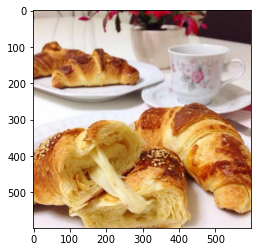

pasta


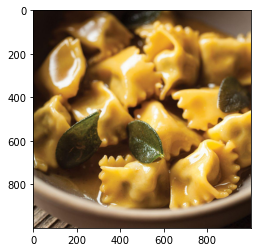

pasta


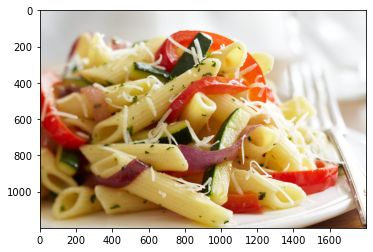

croissant


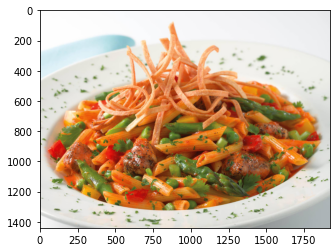

croissant


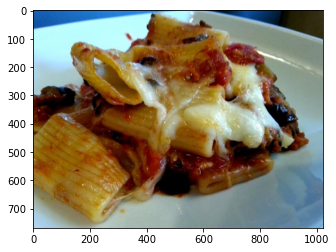

pasta


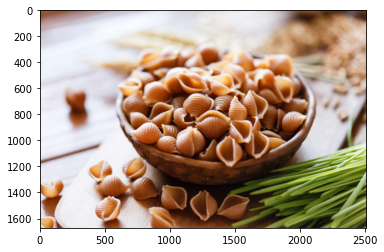

pork


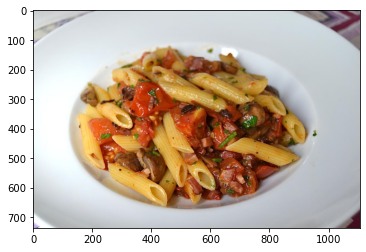

pork


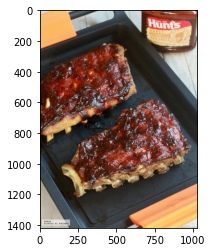

pork


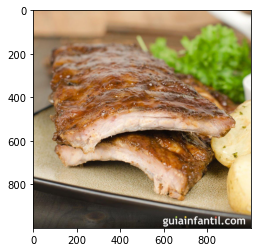

pork


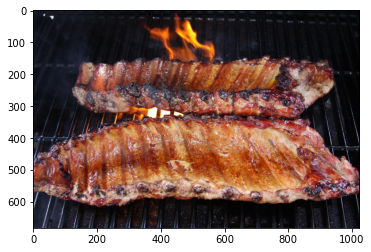

pork


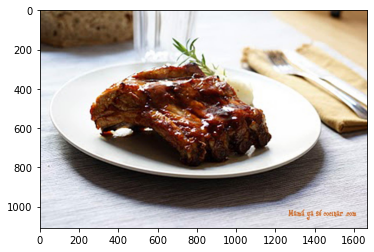

pasta


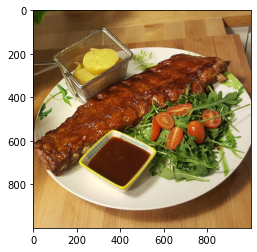

pasta


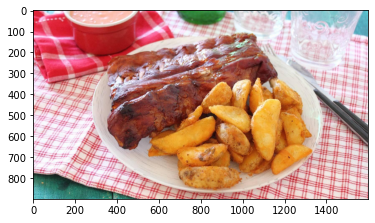

pork


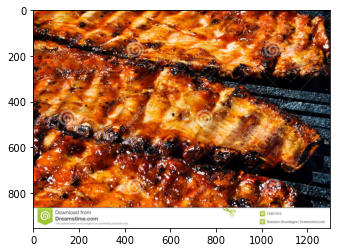

croissant


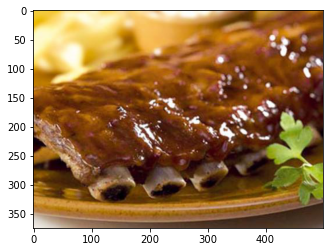

pork


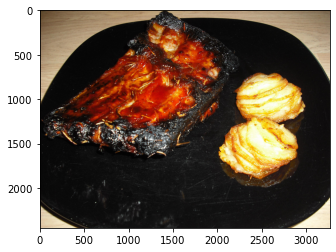

rice


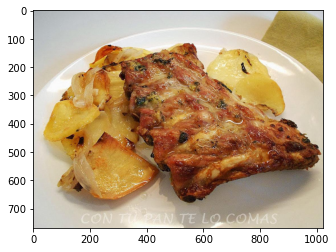

rice


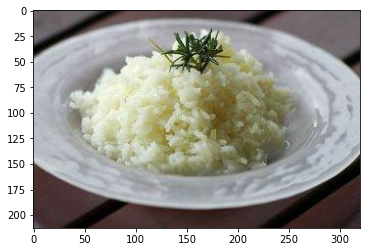

rice


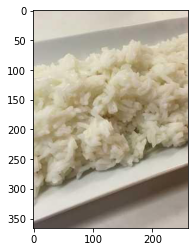

pasta


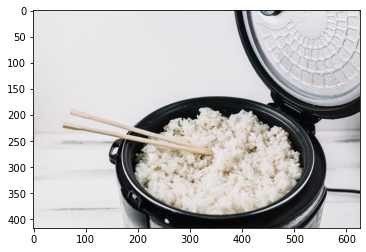

rice


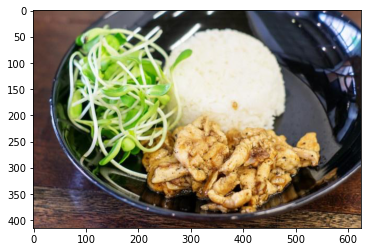

rice


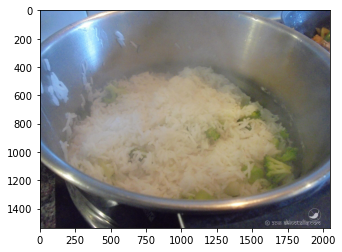

pasta


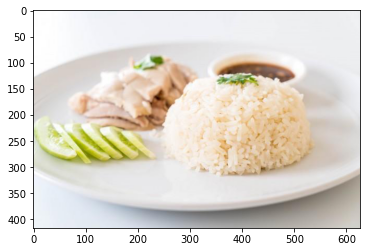

rice


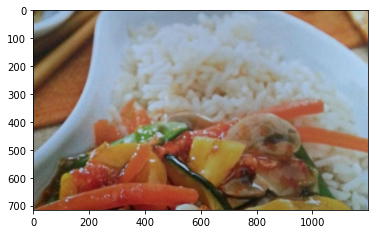

rice


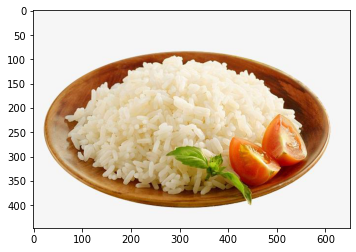

rice


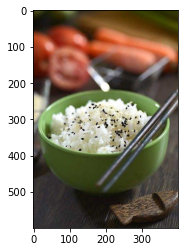

IndexError: index 45 is out of bounds for axis 0 with size 45

In [45]:
i = 1
result = model.predict_classes(test_gen)
for filename in glob.glob('images/test/banana/*.jpg'):
    if result[i]==0:
        print("banana")
    elif result[i]==1:
        print("brocolli")
    elif result[i]==2:
        print("croissant")
    elif result[i]==3:
        print("pasta")
    elif result[i]==4:
        print("pork")
    elif result[i]==5:
        print("rice")
        
    im=Image.open(filename)
    plt.imshow(im)
    plt.show()
    i=i+1
    
for filename in glob.glob('images/test/brocolli/*.jpg'):
    if result[i]==0:
        print("banana")
    elif result[i]==1:
        print("brocolli")
    elif result[i]==2:
        print("croissant")
    elif result[i]==3:
        print("pasta")
    elif result[i]==4:
        print("pork")
    elif result[i]==5:
        print("rice")
        
    im=Image.open(filename)
    plt.imshow(im)
    plt.show()
    i=i+1
    
for filename in glob.glob('images/test/croissant/*.jpg'):
    if result[i]==0:
        print("banana")
    elif result[i]==1:
        print("brocolli")
    elif result[i]==2:
        print("croissant")
    elif result[i]==3:
        print("pasta")
    elif result[i]==4:
        print("pork")
    elif result[i]==5:
        print("rice")
        
    im=Image.open(filename)
    plt.imshow(im)
    plt.show()
    i=i+1
    
for filename in glob.glob('images/test/pasta/*.jpg'):
    if result[i]==0:
        print("banana")
    elif result[i]==1:
        print("brocolli")
    elif result[i]==2:
        print("croissant")
    elif result[i]==3:
        print("pasta")
    elif result[i]==4:
        print("pork")
    elif result[i]==5:
        print("rice")
        
    im=Image.open(filename)
    plt.imshow(im)
    plt.show()
    i=i+1
    
for filename in glob.glob('images/test/pork/*.jpg'):
    if result[i]==0:
        print("banana")
    elif result[i]==1:
        print("brocolli")
    elif result[i]==2:
        print("croissant")
    elif result[i]==3:
        print("pasta")
    elif result[i]==4:
        print("pork")
    elif result[i]==5:
        print("rice")
        
    im=Image.open(filename)
    plt.imshow(im)
    plt.show()
    i=i+1
    
for filename in glob.glob('images/test/rice/*.jpg'):
    if result[i]==0:
        print("banana")
    elif result[i]==1:
        print("brocolli")
    elif result[i]==2:
        print("croissant")
    elif result[i]==3:
        print("pasta")
    elif result[i]==4:
        print("pork")
    elif result[i]==5:
        print("rice")
        
    im=Image.open(filename)
    plt.imshow(im)
    plt.show()
    i=i+1